# Análisis de muestreos geoquímicos de suelos superficiales usando métodos no supervisados de aprendizaje automático como estrategia para la prospección de yacimientos minerales en Perú.

**Integrantes:**

Diana Urbano

Edinson Fernandez

Daren Rodríguez

## **Librerias necesarias**

In [1]:
import numpy as np 

import pandas as pd 

import matplotlib.cm as cm
import matplotlib.colors as colors
import pingouin as pg

import html
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
%matplotlib inline 
print('Main Libraries imported.')

Main Libraries imported.


## **Carga de base de datos**

Se carga la base de datos limpia

In [2]:
data=pd.read_excel('Base_suelos_limpia.xlsx')
data.head()

,Muestra,Codigo_estandar,Longitud,Latitud,UTM_E,UTM_N,Zona,Region,Region_Hidrografica,Cuenca,...,CaO_pct,Fe2O3_pct,K2O_pct,MgO_pct,MnO_pct,Na2O_pct,P2O5_pct,SiO2_pct,TiO2_pct,LOI_pct
0,MS001,JU25GL04,-75.615,-11.624,433000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0.579103,5.126528,1.209799,0.547251,0.190361,0.169776,0.258084,63.402262,0.852058,15.069860
1,MS002,JU25GL04,-75.596,-11.624,435000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,1.022878,4.202161,1.560920,0.583359,0.133624,0.123136,0.576529,66.472176,0.602782,12.749004
2,MS003,JU25GL04,-75.578,-11.624,437000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,3.655012,4.735614,1.398224,1.219700,0.116755,0.333822,0.331651,63.128540,0.879743,13.262343
3,MS004,JU25GL04,-75.651,-11.642,429000.0,8713000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0.339742,6.837651,1.293910,0.697150,0.171097,0.112865,0.158371,61.246408,1.012535,13.134328
4,MS005,JU25GL04,-75.633,-11.642,431000.0,8713000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0.504565,7.234224,1.561313,0.845544,0.249645,0.174458,0.276759,56.111317,1.012983,18.577075


**Tipos de datos**

In [11]:
data.dtypes

Muestra             object
Codigo_estandar     object
Longitud           float64
Latitud            float64
UTM_E              float64
                    ...   
Na2O_pct           float64
P2O5_pct           float64
SiO2_pct           float64
TiO2_pct           float64
LOI_pct            float64
Length: 79, dtype: object

**Histograma general con todas las variables numericas**

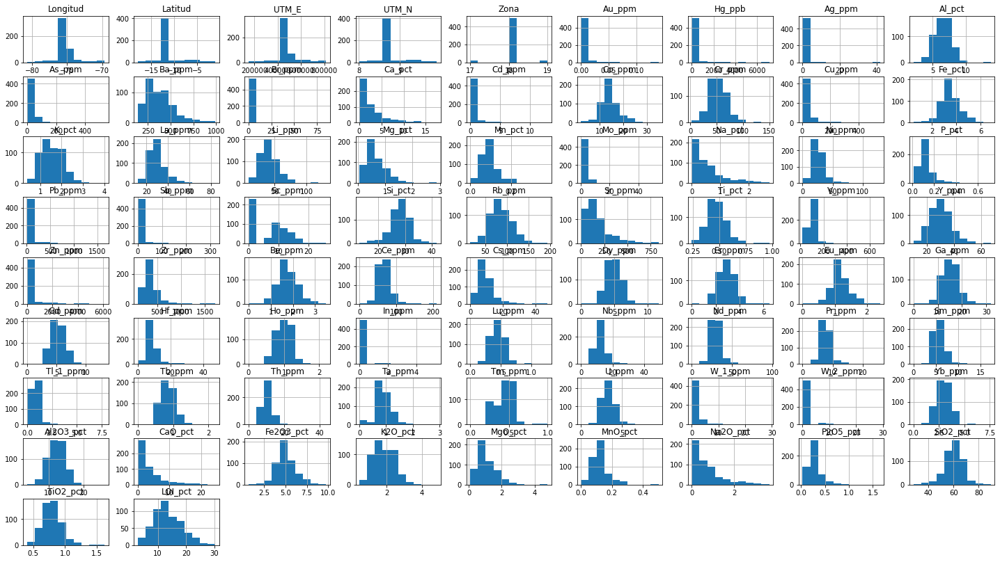

In [3]:
# Histogramas
plt.rcParams["figure.figsize"] = (25,14)
data.hist()
plt.show()

La base de datos cuenta con 10 variables informativas, 58 elementos y 11 oxidos mayores.

In [4]:
# Columnas de la base de datos
data.columns

Index(['Muestra', 'Codigo_estandar', 'Longitud', 'Latitud', 'UTM_E', 'UTM_N',
       'Zona', 'Region', 'Region_Hidrografica', 'Cuenca', 'Au_ppm', 'Hg_ppb',
       'Ag_ppm', 'Al_pct', 'As_ppm', 'Ba_ppm', 'Bi_ppm', 'Ca_pct', 'Cd_ppm',
       'Co_ppm', 'Cr_ppm', 'Cu_ppm', 'Fe_pct', 'K_pct', 'La_ppm', 'Li_ppm',
       'Mg_pct', 'Mn_pct', 'Mo_ppm', 'Na_pct', 'Ni_ppm', 'P_pct', 'Pb_ppm',
       'Sb_ppm', 'Sc_ppm', 'Si_pct', 'Rb_ppm', 'Sr_ppm', 'Ti_pct', 'V_ppm',
       'Y_ppm', 'Zn_ppm', 'Zr_ppm', 'Be_ppm', 'Ce_ppm', 'Cs_ppm', 'Dy_ppm',
       'Er_ppm', 'Eu_ppm', 'Ga_ppm', 'Gd_ppm', 'Hf_ppm', 'Ho_ppm', 'In_ppm',
       'Lu_ppm', 'Nb_ppm', 'Nd_ppm', 'Pr_ppm', 'Sm_ppm', 'Tl_1_ppm', 'Tb_ppm',
       'Th_ppm', 'Ta_ppm', 'Tm_ppm', 'U_ppm', 'W_1_ppm', 'W_2_ppm', 'Yb_ppm',
       'Al2O3_pct', 'CaO_pct', 'Fe2O3_pct', 'K2O_pct', 'MgO_pct', 'MnO_pct',
       'Na2O_pct', 'P2O5_pct', 'SiO2_pct', 'TiO2_pct', 'LOI_pct'],
      dtype='object')

In [5]:
# variables de interes
columns=['Au_ppm', 'Hg_ppb',
       'Ag_ppm', 'Al_pct', 'As_ppm', 'Ba_ppm', 'Bi_ppm', 'Ca_pct', 'Cd_ppm',
       'Co_ppm', 'Cr_ppm', 'Cu_ppm', 'Fe_pct', 'K_pct', 'La_ppm', 'Li_ppm',
       'Mg_pct', 'Mn_pct', 'Mo_ppm', 'Na_pct', 'Ni_ppm', 'P_pct', 'Pb_ppm',
       'Sb_ppm', 'Sc_ppm', 'Si_pct', 'Rb_ppm', 'Sr_ppm', 'Ti_pct', 'V_ppm',
       'Y_ppm', 'Zn_ppm', 'Zr_ppm', 'Be_ppm', 'Ce_ppm', 'Cs_ppm', 'Dy_ppm',
       'Er_ppm', 'Eu_ppm', 'Ga_ppm', 'Gd_ppm', 'Hf_ppm', 'Ho_ppm', 'In_ppm',
       'Lu_ppm', 'Nb_ppm', 'Nd_ppm', 'Pr_ppm', 'Sm_ppm', 'Tl_1_ppm', 'Tb_ppm',
       'Th_ppm', 'Ta_ppm', 'Tm_ppm', 'U_ppm', 'W_1_ppm', 'W_2_ppm', 'Yb_ppm',
       'Al2O3_pct', 'CaO_pct', 'Fe2O3_pct', 'K2O_pct', 'MgO_pct', 'MnO_pct',
       'Na2O_pct', 'P2O5_pct', 'SiO2_pct', 'TiO2_pct', 'LOI_pct']

69 variables de interes (58 elementos y 11 oxidos mayores)

In [334]:

len(columns)

69

In [331]:
# Estadistica de algunos elementos
data[['Au_ppm','Ag_ppm','Cu_ppm','Zn_ppm','Mo_ppm']].describe()

,Au_ppm,Ag_ppm,Cu_ppm,Zn_ppm,Mo_ppm
count,536.000000,5.360000e+02,5.360000e+02,5.360000e+02,536.000000
mean,0.003165,1.764307e+08,1.394794e+08,1.141555e+08,116606.102612
std,0.008886,6.366175e+08,2.028466e+08,2.180378e+08,198725.586928
min,0.000000,0.000000e+00,3.000000e+00,1.300000e+01,0.000000
25%,0.000000,0.000000e+00,2.875000e+01,1.210000e+02,0.000000
50%,0.000000,0.000000e+00,5.650000e+01,2.330000e+02,2.000000
75%,0.005448,6.824524e-01,2.883085e+08,1.449035e+08,250222.500000
max,0.140045,5.231002e+09,9.586025e+08,9.966708e+08,823411.000000


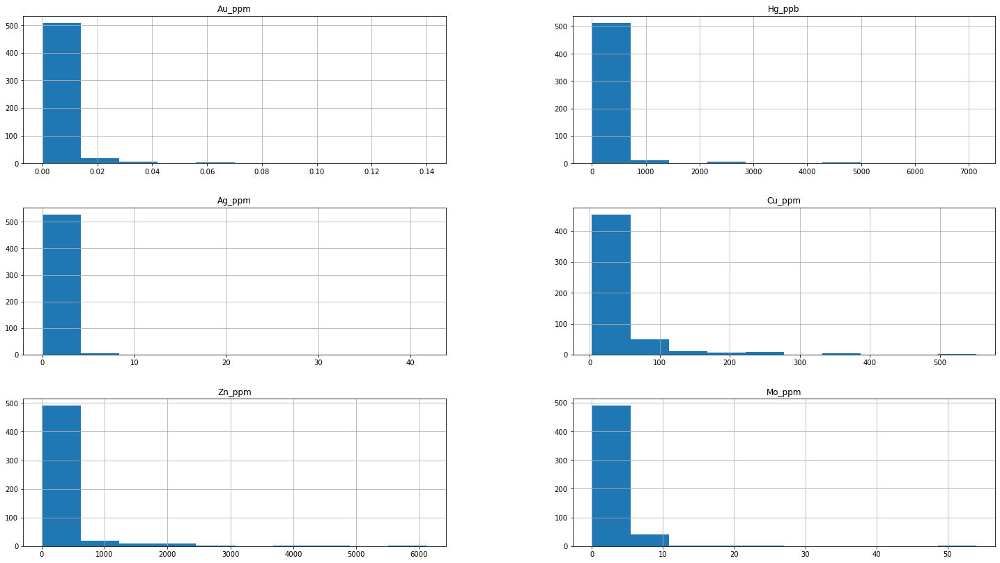

In [7]:
# Histogramas de algunos de los elementos mas importantes
plt.rcParams["figure.figsize"] = (25,14)
data[['Au_ppm','Hg_ppb','Ag_ppm','Cu_ppm','Zn_ppm','Mo_ppm']].hist()
plt.show()

In [333]:
#536 registros de muestras de suelo y 79 variables
data.shape

(536, 79)

Boxplot para los elementos Au, Hg, Ag, Cu, Zn y Mo

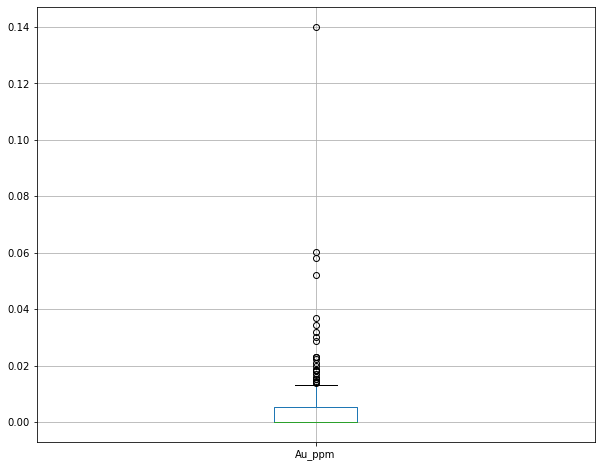

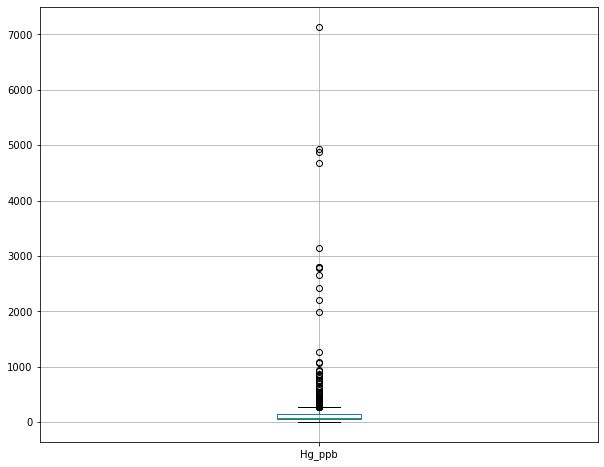

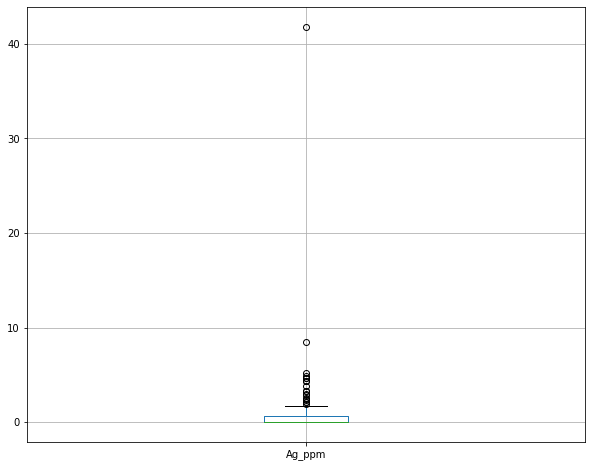

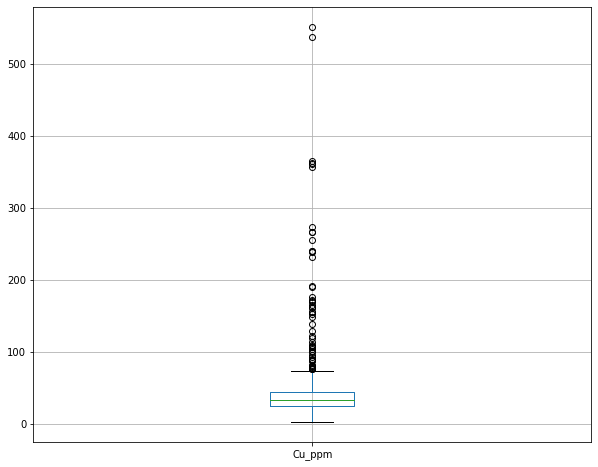

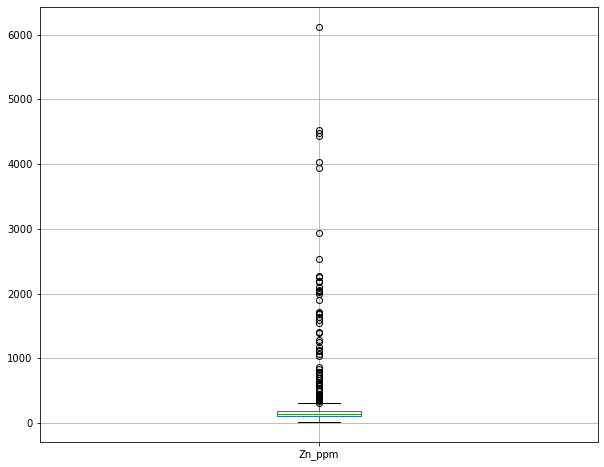

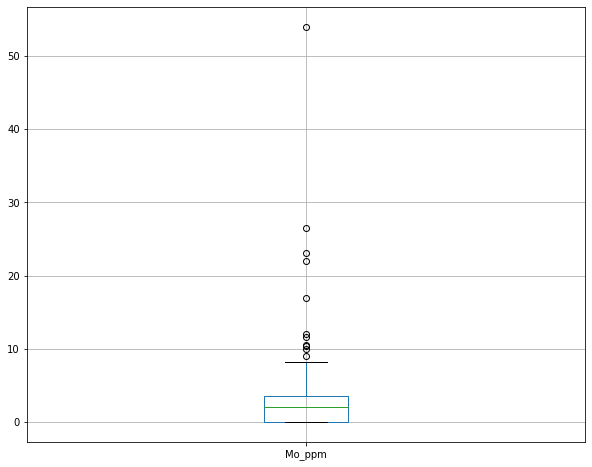

In [8]:
plt.rcParams["figure.figsize"] = (10,8)
l=['Au_ppm','Hg_ppb','Ag_ppm','Cu_ppm','Zn_ppm','Mo_ppm']
for i in l:
    data[[i]].boxplot()
    plt.show()

## **Correlación entre variables**

In [14]:
# matriz de correlación
corr_mat =data[columns].corr()


for x in range(len(columns)):
    corr_mat.iloc[x,x] = 0.0
    
corr_mat

,Au_ppm,Hg_ppb,Ag_ppm,Al_pct,As_ppm,Ba_ppm,Bi_ppm,Ca_pct,Cd_ppm,Co_ppm,...,CaO_pct,Fe2O3_pct,K2O_pct,MgO_pct,MnO_pct,Na2O_pct,P2O5_pct,SiO2_pct,TiO2_pct,LOI_pct
Au_ppm,0.000000,0.007359,0.191449,-0.046896,0.010010,0.055058,0.073787,0.087992,0.204257,-0.053378,...,0.092740,-0.009237,-0.015875,0.068423,0.112848,-0.009617,0.028689,-0.026337,-0.034556,-0.063805
Hg_ppb,0.007359,0.000000,-0.024343,-0.069048,-0.005405,-0.040588,-0.003794,-0.037889,-0.022328,-0.022053,...,-0.037489,-0.064430,-0.062059,-0.029308,-0.135958,-0.011620,-0.103319,-0.067264,-0.008507,-0.040306
Ag_ppm,0.191449,-0.024343,0.000000,0.252715,-0.009871,0.219068,0.343585,0.488694,0.671234,0.140124,...,0.533697,0.346833,0.267690,0.406264,0.250288,-0.034408,-0.022532,0.256507,0.009105,0.109709
Al_pct,-0.046896,-0.069048,0.252715,0.000000,0.073881,0.488924,0.035802,0.380694,0.241605,0.242568,...,0.386290,0.817089,0.805085,0.296096,0.019433,0.185510,-0.096330,0.837206,0.140222,0.532912
As_ppm,0.010010,-0.005405,-0.009871,0.073881,0.000000,0.120459,-0.001786,-0.002138,-0.006576,-0.012345,...,0.025424,0.067573,0.094071,0.098699,-0.034976,0.357536,0.031301,0.080821,-0.004347,0.012846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Na2O_pct,-0.009617,-0.011620,-0.034408,0.185510,0.357536,0.173013,-0.005725,-0.024319,0.149763,-0.031562,...,0.010863,0.132317,0.241137,0.031499,-0.030611,0.000000,-0.030077,0.167921,-0.012836,0.163450
P2O5_pct,0.028689,-0.103319,-0.022532,-0.096330,0.031301,-0.075502,-0.009492,-0.011544,0.004327,0.046114,...,0.002427,-0.055454,-0.100505,0.018830,0.233268,-0.030077,0.000000,-0.073160,-0.036896,-0.096532
SiO2_pct,-0.026337,-0.067264,0.256507,0.837206,0.080821,0.489224,0.044096,0.370022,0.268342,0.287132,...,0.393337,0.766708,0.741922,0.254046,0.002017,0.167921,-0.073160,0.000000,0.092612,0.540804
TiO2_pct,-0.034556,-0.008507,0.009105,0.140222,-0.004347,-0.028822,-0.004191,0.007825,-0.024665,0.080817,...,-0.035203,0.155333,0.084367,-0.032375,0.107087,-0.012836,-0.036896,0.092612,0.000000,0.008396


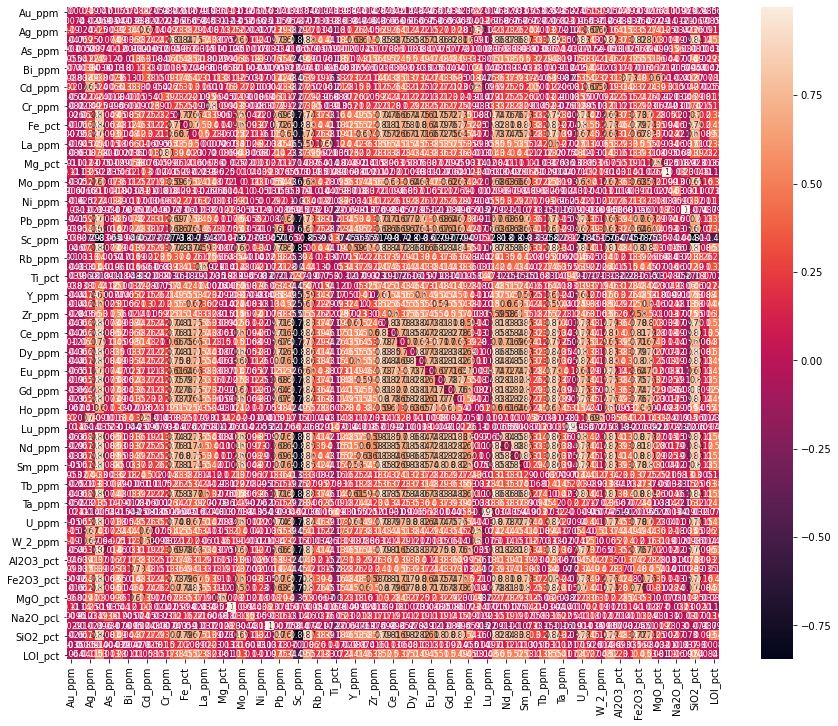

In [345]:
# Matriz de correlación
f, ax = plt.subplots(figsize=(15, 12))
sns.heatmap(corr_mat,square=True,cbar = True, annot = True, annot_kws = {'size': 8} );

In [357]:
# Máxima correlación entre variables
corr_mat.abs().idxmax()

Au_ppm        Cd_ppm
Hg_ppb        Lu_ppm
Ag_ppm        In_ppm
Al_pct        Th_ppm
As_ppm      Na2O_pct
              ...   
Na2O_pct      Na_pct
P2O5_pct       P_pct
SiO2_pct      Si_pct
TiO2_pct      Rb_ppm
LOI_pct       Nb_ppm
Length: 69, dtype: object

In [361]:
# Máxima correlacion
corr_mat.abs().max()

Au_ppm      0.204257
Hg_ppb      0.157071
Ag_ppm      0.725866
Al_pct      0.886740
As_ppm      0.357536
              ...   
Na2O_pct    0.528476
P2O5_pct    0.999410
SiO2_pct    0.873883
TiO2_pct    0.255596
LOI_pct     0.561360
Length: 69, dtype: float64

In [359]:
corr_mat.to_excel('corr_mat.xlsx', sheet_name='corr')

In [15]:
pymesmissed=data.isnull()
#columnas con valores nulos y su porcentaje
columnas_connull=[]
# porcentajes por columna de valores nulos
porc_valoresnull=[]
for column in pymesmissed.columns.values.tolist():
    
    if ((pymesmissed[column]).value_counts()[0]*100/len(pymesmissed))<100:
        columnas_connull.append(column)
        porc_valoresnull.append(float("{0:.3f}".format((pymesmissed[column]).value_counts()[1]*100/len(pymesmissed))))
        print(column,"% valores no nulos y nulos")
        print ((pymesmissed[column]).value_counts()*100/len(pymesmissed))
        print("")
print ("lista de columnas con valores nulos: ",columnas_connull)

print ("lista porcentajes con valores nulos: ",porc_valoresnull)

lista de columnas con valores nulos:  []
lista porcentajes con valores nulos:  []


In [16]:
data.columns

Index(['Muestra', 'Codigo_estandar', 'Longitud', 'Latitud', 'UTM_E', 'UTM_N',
       'Zona', 'Region', 'Region_Hidrografica', 'Cuenca', 'Au_ppm', 'Hg_ppb',
       'Ag_ppm', 'Al_pct', 'As_ppm', 'Ba_ppm', 'Bi_ppm', 'Ca_pct', 'Cd_ppm',
       'Co_ppm', 'Cr_ppm', 'Cu_ppm', 'Fe_pct', 'K_pct', 'La_ppm', 'Li_ppm',
       'Mg_pct', 'Mn_pct', 'Mo_ppm', 'Na_pct', 'Ni_ppm', 'P_pct', 'Pb_ppm',
       'Sb_ppm', 'Sc_ppm', 'Si_pct', 'Rb_ppm', 'Sr_ppm', 'Ti_pct', 'V_ppm',
       'Y_ppm', 'Zn_ppm', 'Zr_ppm', 'Be_ppm', 'Ce_ppm', 'Cs_ppm', 'Dy_ppm',
       'Er_ppm', 'Eu_ppm', 'Ga_ppm', 'Gd_ppm', 'Hf_ppm', 'Ho_ppm', 'In_ppm',
       'Lu_ppm', 'Nb_ppm', 'Nd_ppm', 'Pr_ppm', 'Sm_ppm', 'Tl_1_ppm', 'Tb_ppm',
       'Th_ppm', 'Ta_ppm', 'Tm_ppm', 'U_ppm', 'W_1_ppm', 'W_2_ppm', 'Yb_ppm',
       'Al2O3_pct', 'CaO_pct', 'Fe2O3_pct', 'K2O_pct', 'MgO_pct', 'MnO_pct',
       'Na2O_pct', 'P2O5_pct', 'SiO2_pct', 'TiO2_pct', 'LOI_pct'],
      dtype='object')

In [9]:
norm=['Au_ppm', 'Hg_ppb',
       'Ag_ppm', 'Al_pct', 'As_ppm', 'Ba_ppm', 'Bi_ppm', 'Ca_pct', 'Cd_ppm',
       'Co_ppm', 'Cr_ppm', 'Cu_ppm', 'Fe_pct', 'K_pct', 'La_ppm', 'Li_ppm',
       'Mg_pct', 'Mn_pct', 'Mo_ppm', 'Na_pct', 'Ni_ppm', 'P_pct', 'Pb_ppm',
       'Sb_ppm', 'Sc_ppm', 'Si_pct', 'Rb_ppm', 'Sr_ppm', 'Ti_pct', 'V_ppm',
       'Y_ppm', 'Zn_ppm', 'Zr_ppm', 'Be_ppm', 'Ce_ppm', 'Cs_ppm', 'Dy_ppm',
       'Er_ppm', 'Eu_ppm', 'Ga_ppm', 'Gd_ppm', 'Hf_ppm', 'Ho_ppm', 'In_ppm',
       'Lu_ppm', 'Nb_ppm', 'Nd_ppm', 'Pr_ppm', 'Sm_ppm', 'Tl_1_ppm', 'Tb_ppm',
       'Th_ppm', 'Ta_ppm', 'Tm_ppm', 'U_ppm', 'W_1_ppm', 'W_2_ppm', 'Yb_ppm',
       'Al2O3_pct', 'CaO_pct', 'Fe2O3_pct', 'K2O_pct', 'MgO_pct', 'MnO_pct',
       'Na2O_pct', 'P2O5_pct', 'SiO2_pct', 'TiO2_pct', 'LOI_pct']

In [10]:
# se realiza una copia de la base de datos
suelos=data.copy()

In [11]:
# Descripción estadistica de las variables
suelos[norm].describe()

,Au_ppm,Hg_ppb,Ag_ppm,Al_pct,As_ppm,Ba_ppm,Bi_ppm,Ca_pct,Cd_ppm,Co_ppm,...,CaO_pct,Fe2O3_pct,K2O_pct,MgO_pct,MnO_pct,Na2O_pct,P2O5_pct,SiO2_pct,TiO2_pct,LOI_pct
count,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,...,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000,536.000000
mean,0.003165,207.603595,0.464829,6.522966,39.047795,384.513872,0.179910,2.704459,0.432213,14.133991,...,3.784085,5.010768,1.857802,1.104936,0.122382,0.743754,0.283475,59.939002,0.795169,13.505906
std,0.008886,572.940192,1.965958,1.260892,42.935075,154.948527,3.703582,3.107204,1.289702,4.054684,...,4.347238,1.213802,0.602705,0.626789,0.059605,0.706993,0.153848,7.979961,0.153032,4.936891
min,0.000000,0.000000,0.000000,2.070000,0.000000,139.519800,0.000000,0.030000,0.000000,2.000000,...,0.040000,0.700000,0.470000,0.090000,0.000000,0.000000,0.030000,27.840000,0.404484,2.960000
25%,0.000000,53.000000,0.000000,5.630354,20.985202,274.716000,0.000000,0.509683,0.000000,11.944100,...,0.710000,4.330601,1.400000,0.640000,0.088855,0.220000,0.200000,55.687821,0.692086,9.879711
50%,0.000000,81.000000,0.000000,6.546107,31.320670,359.299000,0.000000,1.550000,0.000000,14.000000,...,2.170000,4.871322,1.825663,0.930000,0.110000,0.513252,0.253939,60.405000,0.789230,12.958746
75%,0.005448,140.000000,0.682452,7.425000,42.205644,457.984663,0.000000,3.650586,0.000000,16.000000,...,5.107858,5.683218,2.290268,1.418924,0.142785,0.973827,0.330000,64.871488,0.890000,16.841557
max,0.140045,7137.500000,41.800000,13.740000,533.000000,991.000000,85.000000,17.510000,13.000000,35.000000,...,24.500000,9.750000,4.830000,4.792454,0.500000,3.670000,1.650000,89.660000,1.620000,30.300000


In [12]:
# se crea un nuevo dataframe solo con las 69 variables de interes
s_2=suelos[norm].copy()

## Metodos no supervisados

### PCA

Principal Component Analysis (PCA) es un método estadístico que permite simplificar la complejidad de espacios muestrales con muchas dimensiones a la vez que conserva su información

Este método de transformación de variables consiste en hacer cumplir las dos condiciones establecidas previamente, pero teniendo en cuenta únicamente la información de los predictores y no necesariamente la relación de estos con la variable de respuesta. En particular, se debe encontrar los vectores $V_{j}$ y los valores $\lambda_{j}$ que cumplan la siguiente ecuación:

$$S_{x}V_{j}=\lambda_{j}V_{j}$$

Donde $S_{x}$ es la matriz de varianza y covarianza de la matriz de predictores ($X$). Finalmente, la matriz de transformación $A$ tiene como columnas a cada uno de los vectores $V_{j}$. Además, $\lambda_{j}$ corresponde a la varianza o información que condensa la variable transformada $Z_{j}$.

El método de PCA permite por lo tanto “condensar” la información aportada por múltiples variables en solo unas pocas componentes.

**Standard Scaler**

Se estandarizan las variables y se transforman a la misma escala eliminando la media y escalando los datos de forma que su varianza sea igual a 1. Con esto se busca que se le asigne igual importancia a cada variable.


In [13]:
scaler = StandardScaler()
scaler.fit(s_2)
XEscalado=scaler.transform(s_2)

In [14]:
p=len(XEscalado[1,])
pca = PCA(n_components=p).fit(XEscalado)
A=pca.components_

Podemos visualizar la varianza explicada por cada componente. Para ello, haremos el siguiente gráfico:


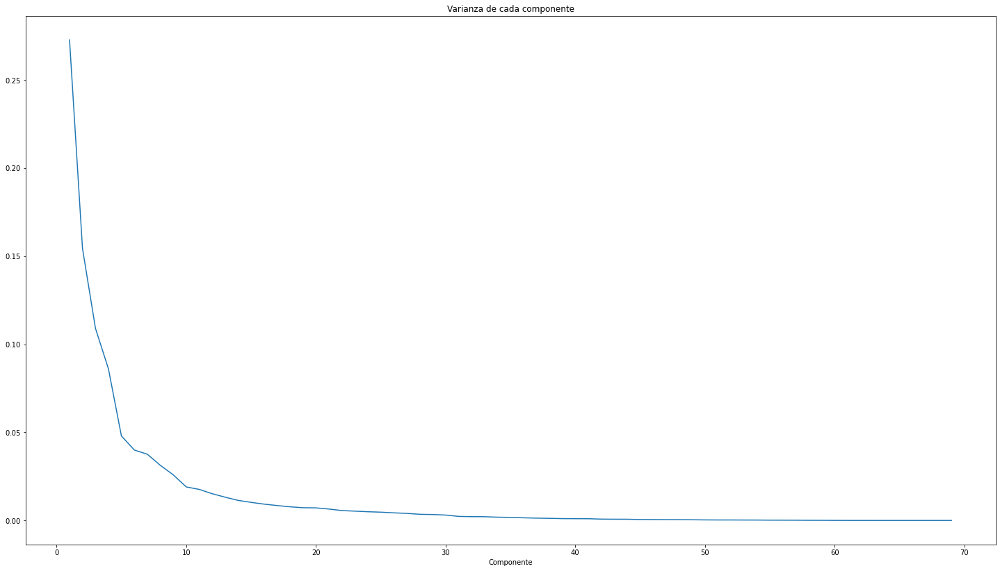

In [15]:
plt.rcParams["figure.figsize"] = (25,14)
varianzaExplicada=pca.explained_variance_
porcentajeVarianzaExplicada=pca.explained_variance_ratio_
plt.plot(range(1,p+1),porcentajeVarianzaExplicada)
plt.xlabel('Componente')
plt.title('Varianza de cada componente')
plt.show()

Como se puede observar, las componentes están ordenadas desde la que más varianza o información contiene, hasta la que menos. Los valores reportados en el anterior gráfico corresponden a los 𝜆𝑗 establecidos con anterioridad.

Sin embargo, generalmente se suele ver el gráfico del porcentaje de la variabilidad explicado por las primeras 𝑗 componentes. Para ello obtener dicho gráfico, ejecutaremos el siguiente código:


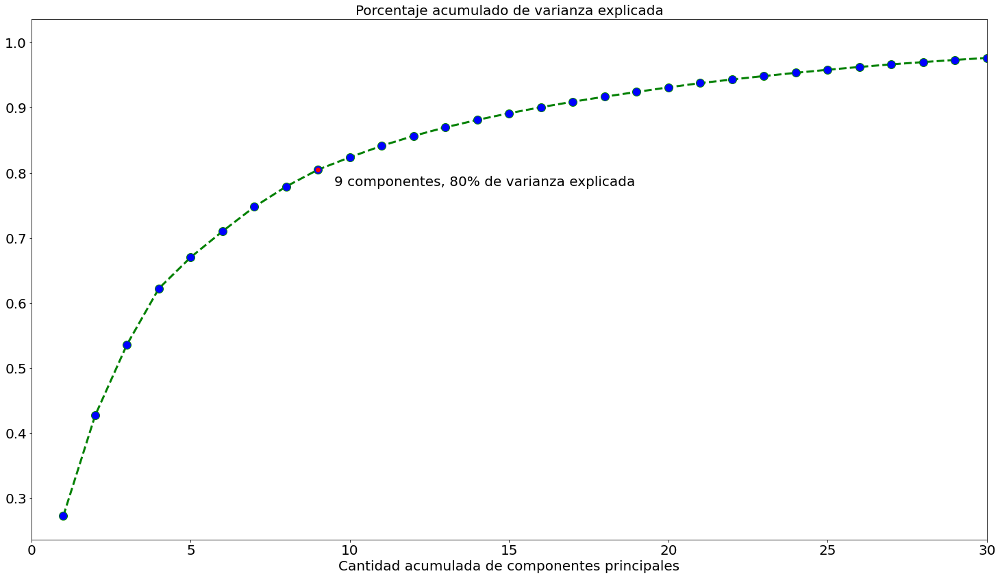

In [26]:
plt.plot(range(1,p+1),np.cumsum(porcentajeVarianzaExplicada),color='green', linestyle='dashed', linewidth = 3,
         marker='o', markerfacecolor='blue', markersize=12)
plt.xlabel('Cantidad acumulada de componentes principales',fontsize=20)
plt.title('Porcentaje acumulado de varianza explicada',fontsize=20)
plt.plot(9,0.805, marker="o", color="red")
plt.text(9.5,0.78, '9 componentes, 80% de varianza explicada', fontsize=20, color='black')
plt.xlim(0,30)
plt.xticks(fontsize = 20) 
plt.yticks(fontsize = 20) 
plt.show()

In [18]:
explained_variance =np.cumsum(porcentajeVarianzaExplicada)
explained_variance[8]

0.8049206030573637

Vemos que con 9 componentes principales se explica el 80% de la variabilidad de los datos

In [27]:
# se usan 9 componentes
pca = PCA(n_components=9)
pca.fit(XEscalado)

PCA(n_components=9)

In [28]:
# se escalan y transforman las variables
pca.transform(XEscalado)

array([[-0.30824682, -1.5129691 ,  1.66155779, ..., -0.54050499,
        -0.29255247, -0.06485746],
       [-1.49137349, -1.92649768,  2.1426526 , ..., -2.44845823,
        -0.20104766, -2.47282385],
       [-4.3394751 , -1.94563596, -0.15102627, ..., -0.4663399 ,
         0.08966862, -0.2939691 ],
       ...,
       [ 2.15180864, -6.26845765,  4.50793463, ...,  1.47837393,
         1.00537525,  1.55102   ],
       [ 4.97692014, -0.91013319, -0.19835065, ...,  0.18645153,
         0.71632772,  0.60720164],
       [ 3.6722062 , -4.77693468,  3.34856336, ...,  1.07834823,
        -0.44012748,  0.0415326 ]])

In [29]:
# Se crea el score con los pca transformados
scores_pca=pca.transform(XEscalado)

In [30]:
scores_pca[1]

array([-1.49137349, -1.92649768,  2.1426526 ,  2.62867088, -0.79013001,
        1.27156358, -2.44845823, -0.20104766, -2.47282385])

In [31]:
# se copia la base de datos para insertar las 9 componentes principales en la base de datos
py_pca=s_2.copy()

In [32]:
df_pca_cluster=pd.concat([py_pca.reset_index(drop=True),pd.DataFrame(scores_pca)],axis=1)

In [33]:
# se crean las 9 variables con los 9 componentes principales 
df_pca_cluster.columns.values[-9:]=["PCA_1","PCA_2","PCA_3","PCA_4","PCA_5","PCA_6","PCA_7","PCA_8","PCA_9"]
df_pca_cluster.head()

,Au_ppm,Hg_ppb,Ag_ppm,Al_pct,As_ppm,Ba_ppm,Bi_ppm,Ca_pct,Cd_ppm,Co_ppm,...,LOI_pct,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9
0,0.0,85.9,0.779645,6.157344,22.14267,223.4628,0.0,0.413885,0.000000,17.201376,...,15.069860,-0.308247,-1.512969,1.661558,2.364037,2.038334,-0.398224,-0.540505,-0.292552,-0.064857
1,0.0,110.0,0.891250,5.507157,32.90210,218.9847,0.0,0.731051,1.094613,12.120732,...,12.749004,-1.491373,-1.926498,2.142653,2.628671,-0.790130,1.271564,-2.448458,-0.201048,-2.472824
2,0.0,195.0,0.802467,5.442956,28.99644,224.7234,0.0,2.612237,0.000000,16.689348,...,13.262343,-4.339475,-1.945636,-0.151026,1.319563,2.606516,-0.686350,-0.466340,0.089669,-0.293969
3,0.0,134.0,0.882220,7.204727,46.78234,179.9919,0.0,0.242813,0.000000,19.222920,...,13.134328,1.032224,-0.332223,1.183902,2.721545,3.399843,-0.962293,-0.320244,-0.397469,0.708341
4,0.0,80.5,0.807313,7.362417,20.45032,195.3974,0.0,0.360613,0.000000,19.609992,...,18.577075,2.330777,0.768885,1.005685,3.827270,2.055592,-1.169075,0.483026,-1.378708,-0.706778


In [34]:
# total de columnas con los 58 elementos, 11 oxidos mayores y 9 componentes principales
df_pca_cluster.columns


Index(['Au_ppm', 'Hg_ppb', 'Ag_ppm', 'Al_pct', 'As_ppm', 'Ba_ppm', 'Bi_ppm',
       'Ca_pct', 'Cd_ppm', 'Co_ppm', 'Cr_ppm', 'Cu_ppm', 'Fe_pct', 'K_pct',
       'La_ppm', 'Li_ppm', 'Mg_pct', 'Mn_pct', 'Mo_ppm', 'Na_pct', 'Ni_ppm',
       'P_pct', 'Pb_ppm', 'Sb_ppm', 'Sc_ppm', 'Si_pct', 'Rb_ppm', 'Sr_ppm',
       'Ti_pct', 'V_ppm', 'Y_ppm', 'Zn_ppm', 'Zr_ppm', 'Be_ppm', 'Ce_ppm',
       'Cs_ppm', 'Dy_ppm', 'Er_ppm', 'Eu_ppm', 'Ga_ppm', 'Gd_ppm', 'Hf_ppm',
       'Ho_ppm', 'In_ppm', 'Lu_ppm', 'Nb_ppm', 'Nd_ppm', 'Pr_ppm', 'Sm_ppm',
       'Tl_1_ppm', 'Tb_ppm', 'Th_ppm', 'Ta_ppm', 'Tm_ppm', 'U_ppm', 'W_1_ppm',
       'W_2_ppm', 'Yb_ppm', 'Al2O3_pct', 'CaO_pct', 'Fe2O3_pct', 'K2O_pct',
       'MgO_pct', 'MnO_pct', 'Na2O_pct', 'P2O5_pct', 'SiO2_pct', 'TiO2_pct',
       'LOI_pct', 'PCA_1', 'PCA_2', 'PCA_3', 'PCA_4', 'PCA_5', 'PCA_6',
       'PCA_7', 'PCA_8', 'PCA_9'],
      dtype='object')

In [35]:
# matriz de correlación de componentes principales
corr_mat2 =df_pca_cluster.corr()

for x in range(len(df_pca_cluster.columns)):
    corr_mat2.iloc[x,x] = 0.0
    
corr_mat2.iloc[69:,:69]



,Au_ppm,Hg_ppb,Ag_ppm,Al_pct,As_ppm,Ba_ppm,Bi_ppm,Ca_pct,Cd_ppm,Co_ppm,...,CaO_pct,Fe2O3_pct,K2O_pct,MgO_pct,MnO_pct,Na2O_pct,P2O5_pct,SiO2_pct,TiO2_pct,LOI_pct
PCA_1,-0.061555,-0.213551,-0.168917,0.565541,-0.244345,0.130999,-0.082412,-0.611013,-0.211721,0.398255,...,-0.611038,0.366436,0.359360,-0.196973,0.016169,0.054004,-0.261295,0.392080,0.697250,-0.499865
PCA_2,0.490628,0.469129,0.510300,0.337443,0.773236,0.482866,0.358732,0.146384,0.611856,0.382145,...,0.146321,0.689103,0.347557,0.446826,0.559498,0.374166,0.137386,-0.396364,-0.026116,0.018311
PCA_3,0.356441,0.357489,0.440111,-0.496790,0.462874,-0.363158,0.331903,-0.197611,0.398727,-0.325014,...,-0.197605,-0.261765,-0.391332,-0.559074,0.145135,-0.519564,-0.053200,0.441395,-0.009609,-0.033202
PCA_4,-0.261284,-0.154379,-0.162790,0.039217,-0.061132,-0.559519,-0.179144,0.101158,0.031359,0.386409,...,0.101176,0.222303,-0.345967,-0.230906,0.474468,-0.570307,0.432990,-0.394459,-0.000895,0.616825
PCA_5,0.002392,-0.079047,0.024203,0.258360,0.012859,-0.023789,0.049849,-0.482966,-0.087237,0.413319,...,-0.482949,0.381193,-0.368417,-0.111507,0.210883,0.110143,-0.235948,0.330788,0.535686,-0.287762
PCA_6,-0.038252,-0.100073,-0.183449,-0.171081,-0.053947,0.174065,-0.154382,0.006553,0.235911,-0.079709,...,0.006528,-0.021106,0.064187,0.344827,-0.092324,0.373068,0.258246,0.161495,0.001329,-0.292630
PCA_7,0.040616,-0.058743,-0.066064,-0.185477,-0.055498,-0.072570,-0.028537,0.473424,-0.129604,0.143387,...,0.473436,0.136731,-0.304975,0.287201,0.120973,0.020143,-0.088457,-0.366823,0.239017,0.225249
PCA_8,0.477074,0.343032,0.579198,0.119081,0.044667,0.068842,0.710228,0.042077,-0.208428,-0.099662,...,0.041959,-0.107557,-0.130924,-0.002736,-0.350835,-0.039938,0.046047,-0.114365,0.066949,0.136192
PCA_9,-0.125411,-0.020194,-0.124190,0.080825,-0.013747,0.044469,-0.164303,0.172445,0.148156,-0.018929,...,0.172436,-0.049263,-0.157491,0.027827,-0.203723,-0.068217,-0.699773,-0.097261,-0.018047,0.012326


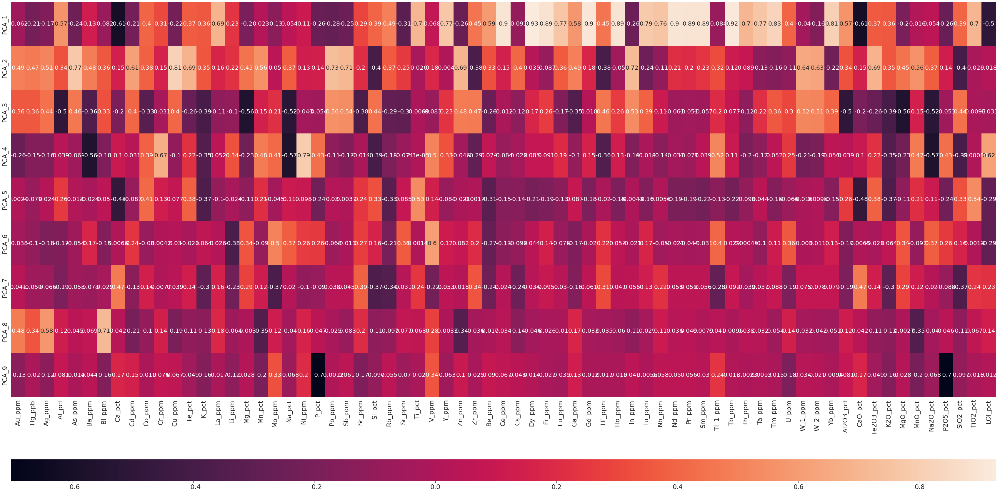

In [36]:
# Matriz de correlación entre los componentes principales y las variables 
grid_kws = {"height_ratios": (.9, 0.05), "hspace":0.3}
sns.set(font_scale=2)
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws,figsize=(60, 30))

ax = sns.heatmap(corr_mat2.iloc[69:,:69], ax=ax,

                 cbar_ax=cbar_ax,

                 cbar_kws={"orientation": "horizontal"},annot = True, annot_kws = {'size': 20})

## Dendograma

Se crea el dendograma para una distancia de 30, usando el metodo ward y las 9 componentes principales.

Se cortan 13 clusteres los cuales se usaran en el analisis aglomerativo

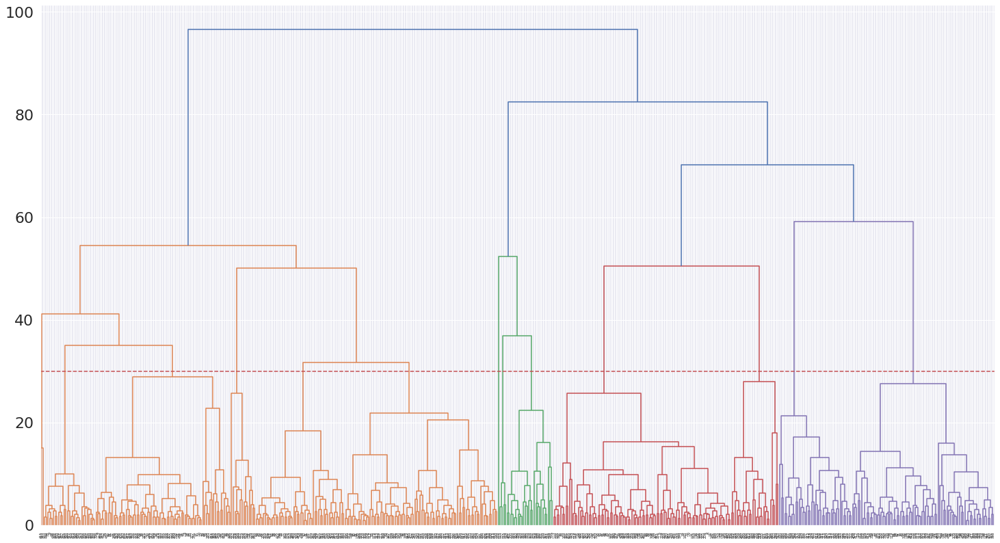

In [37]:
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(scores_pca, method='ward'))
plt.axhline(y=30,color="r",linestyle="dashed")

In [38]:
# Se copia la base de datos para hacer el analisis de cluster aglomerativo
df_pca_agglom=df_pca_cluster.copy()

### Análisis de clúster Aglomerativo

Es un tipo de clúster jerárquico, en el cual el agrupamiento se inicia con todas las observaciones separadas, cada una formando un clúster individual. Los clústeres se van combinado a medida que la estructura crece hasta converger en uno solo (Amat, 2020).

5.3.2.1 Pasos del clustering aglomerativo (Amat, 2020)

    a) Considerar cada una de las n observaciones como un clúster individual, formando así la base del dendrograma (hojas).
    b) Proceso iterativo hasta que todas las observaciones pertenecen a un único clúster:
    i. Calcular la distancia entre cada posible par de los n clústeres. El investigador debe determinar el tipo de medida empleada para cuantificar la similitud entre observaciones o grupos (distancia y linkage).
    ii. Los dos clústeres más similares se fusionan, de forma que quedan n-1 clústeres.
    c) Cortar la estructura de árbol generada (dendrograma) a una determinada altura para crear los clústeres finales.

In [39]:
# Ajuste del modelo
from sklearn.cluster import AgglomerativeClustering
# Se usan 13 cluster
ag = AgglomerativeClustering(n_clusters=13, linkage='ward', compute_full_tree=True)
ag = ag.fit(scores_pca)
# se crea una nueva variable con los clúster aglomerativos
df_pca_agglom['agglom'] = ag.fit_predict(scores_pca)

In [40]:
# Base de datos con los cluster aglomerativos asignados a cada registro
df_pca_agglom.head()

,Au_ppm,Hg_ppb,Ag_ppm,Al_pct,As_ppm,Ba_ppm,Bi_ppm,Ca_pct,Cd_ppm,Co_ppm,...,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,agglom
0,0.0,85.9,0.779645,6.157344,22.14267,223.4628,0.0,0.413885,0.000000,17.201376,...,-0.308247,-1.512969,1.661558,2.364037,2.038334,-0.398224,-0.540505,-0.292552,-0.064857,0
1,0.0,110.0,0.891250,5.507157,32.90210,218.9847,0.0,0.731051,1.094613,12.120732,...,-1.491373,-1.926498,2.142653,2.628671,-0.790130,1.271564,-2.448458,-0.201048,-2.472824,7
2,0.0,195.0,0.802467,5.442956,28.99644,224.7234,0.0,2.612237,0.000000,16.689348,...,-4.339475,-1.945636,-0.151026,1.319563,2.606516,-0.686350,-0.466340,0.089669,-0.293969,7
3,0.0,134.0,0.882220,7.204727,46.78234,179.9919,0.0,0.242813,0.000000,19.222920,...,1.032224,-0.332223,1.183902,2.721545,3.399843,-0.962293,-0.320244,-0.397469,0.708341,0
4,0.0,80.5,0.807313,7.362417,20.45032,195.3974,0.0,0.360613,0.000000,19.609992,...,2.330777,0.768885,1.005685,3.827270,2.055592,-1.169075,0.483026,-1.378708,-0.706778,0


In [43]:
# se copia la base de datos suelo con todas las variables incluyendo las informativas
Base_cluster=suelos.copy()

In [44]:
# se concatenan las bases de datos para tener toda la informacion incluyendo las variables informativas
b2=pd.concat([Base_cluster, df_pca_agglom["agglom"]], axis=1)

In [45]:
# Base de datos concatenada
b2.head()

,Muestra,Codigo_estandar,Longitud,Latitud,UTM_E,UTM_N,Zona,Region,Region_Hidrografica,Cuenca,...,Fe2O3_pct,K2O_pct,MgO_pct,MnO_pct,Na2O_pct,P2O5_pct,SiO2_pct,TiO2_pct,LOI_pct,agglom
0,MS001,JU25GL04,-75.615,-11.624,433000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,5.126528,1.209799,0.547251,0.190361,0.169776,0.258084,63.402262,0.852058,15.069860,0
1,MS002,JU25GL04,-75.596,-11.624,435000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,4.202161,1.560920,0.583359,0.133624,0.123136,0.576529,66.472176,0.602782,12.749004,7
2,MS003,JU25GL04,-75.578,-11.624,437000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,4.735614,1.398224,1.219700,0.116755,0.333822,0.331651,63.128540,0.879743,13.262343,7
3,MS004,JU25GL04,-75.651,-11.642,429000.0,8713000.0,18,Junín,Amazonas,Cuenca Mantaro,...,6.837651,1.293910,0.697150,0.171097,0.112865,0.158371,61.246408,1.012535,13.134328,0
4,MS005,JU25GL04,-75.633,-11.642,431000.0,8713000.0,18,Junín,Amazonas,Cuenca Mantaro,...,7.234224,1.561313,0.845544,0.249645,0.174458,0.276759,56.111317,1.012983,18.577075,0


## Correlacion entre cluster aglomerativo y variables

In [46]:
# se crean las variables dummi de los cluster aglomerativos
b2_dum=pd.get_dummies(b2,columns=["agglom"])
b2_dum.head()

,Muestra,Codigo_estandar,Longitud,Latitud,UTM_E,UTM_N,Zona,Region,Region_Hidrografica,Cuenca,...,agglom_3,agglom_4,agglom_5,agglom_6,agglom_7,agglom_8,agglom_9,agglom_10,agglom_11,agglom_12
0,MS001,JU25GL04,-75.615,-11.624,433000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0,0,0,0,0,0,0,0,0,0
1,MS002,JU25GL04,-75.596,-11.624,435000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0,0,0,0,1,0,0,0,0,0
2,MS003,JU25GL04,-75.578,-11.624,437000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0,0,0,0,1,0,0,0,0,0
3,MS004,JU25GL04,-75.651,-11.642,429000.0,8713000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0,0,0,0,0,0,0,0,0,0
4,MS005,JU25GL04,-75.633,-11.642,431000.0,8713000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0,0,0,0,0,0,0,0,0,0


In [47]:
m2=['Au_ppm', 'Hg_ppb',
       'Ag_ppm', 'Al_pct', 'As_ppm', 'Ba_ppm', 'Bi_ppm', 'Ca_pct', 'Cd_ppm',
       'Co_ppm', 'Cr_ppm', 'Cu_ppm', 'Fe_pct', 'K_pct', 'La_ppm', 'Li_ppm',
       'Mg_pct', 'Mn_pct', 'Mo_ppm', 'Na_pct', 'Ni_ppm', 'P_pct', 'Pb_ppm',
       'Sb_ppm', 'Sc_ppm', 'Si_pct', 'Rb_ppm', 'Sr_ppm', 'Ti_pct', 'V_ppm',
       'Y_ppm', 'Zn_ppm', 'Zr_ppm', 'Be_ppm', 'Ce_ppm', 'Cs_ppm', 'Dy_ppm',
       'Er_ppm', 'Eu_ppm', 'Ga_ppm', 'Gd_ppm', 'Hf_ppm', 'Ho_ppm', 'In_ppm',
       'Lu_ppm', 'Nb_ppm', 'Nd_ppm', 'Pr_ppm', 'Sm_ppm', 'Tl_1_ppm', 'Tb_ppm',
       'Th_ppm', 'Ta_ppm', 'Tm_ppm', 'U_ppm', 'W_1_ppm', 'W_2_ppm', 'Yb_ppm',
       'Al2O3_pct', 'CaO_pct', 'Fe2O3_pct', 'K2O_pct', 'MgO_pct', 'MnO_pct',
       'Na2O_pct', 'P2O5_pct', 'SiO2_pct', 'TiO2_pct', 'LOI_pct', "agglom_0","agglom_1","agglom_2","agglom_3","agglom_4","agglom_5","agglom_6","agglom_7","agglom_8","agglom_9","agglom_10","agglom_11","agglom_12"]

In [48]:
# grafica con todos los cluster aglomerativos
import plotly.express as px
 
dat = df_pca_agglom
fig = px.scatter_3d(dat, x='PCA_1', y='PCA_2', z='PCA_3',
              color='agglom')
fig.show()
fig.write_html("agglom13")



In [49]:
# matriz de correlación de cluster aglomerativos
corr_mat3 =b2_dum[m2].corr()

for x in range(len(m2)):
    corr_mat3.iloc[x,x] = 0.0
    
corr_mat3.iloc[69:,:69]

,Au_ppm,Hg_ppb,Ag_ppm,Al_pct,As_ppm,Ba_ppm,Bi_ppm,Ca_pct,Cd_ppm,Co_ppm,...,CaO_pct,Fe2O3_pct,K2O_pct,MgO_pct,MnO_pct,Na2O_pct,P2O5_pct,SiO2_pct,TiO2_pct,LOI_pct
agglom_0,-0.105310,-0.078658,-0.015963,0.076353,-0.023373,-0.258542,-0.019764,-0.151998,-0.078242,0.160280,...,-0.151983,0.096147,-0.138281,-0.213370,0.190095,-0.282476,0.183588,0.041331,0.069312,0.096004
agglom_1,-0.055180,0.030671,-0.014363,-0.370425,-0.026354,-0.085883,-0.020366,0.749469,-0.036842,-0.254215,...,0.749461,-0.314473,-0.159330,0.207510,-0.103936,-0.114788,0.098253,-0.564021,-0.476717,0.519881
agglom_2,-0.002557,-0.057903,-0.049729,-0.214394,-0.176717,-0.063266,-0.011199,-0.145799,-0.077257,-0.340435,...,-0.145800,-0.384763,-0.163429,-0.157685,-0.318477,-0.089881,-0.279646,0.387831,0.203679,-0.247606
agglom_3,0.059724,-0.039919,-0.033289,0.217304,-0.062706,0.209843,-0.007963,-0.050945,-0.054934,0.207922,...,-0.050946,0.256208,0.306052,0.194203,-0.006362,0.169215,-0.030168,-0.055422,0.301181,-0.136759
agglom_4,-0.018516,-0.054970,-0.062750,0.287465,-0.003594,0.498604,-0.013994,0.026608,-0.042061,0.177625,...,0.026639,0.273265,0.216365,0.507544,-0.017407,0.712013,-0.015640,-0.106966,0.032049,-0.259092
agglom_5,0.019121,-0.027550,-0.064160,0.273754,-0.090884,0.186231,-0.021256,-0.157613,-0.005781,-0.019257,...,-0.157618,0.053110,0.267197,0.076241,-0.170772,0.213168,-0.154510,0.102098,0.027349,-0.234610
agglom_6,0.666600,0.523415,0.909859,-0.016919,0.497853,0.148434,0.991072,-0.020256,0.119712,-0.065466,...,-0.020348,0.048816,-0.028562,-0.017601,0.034571,0.006503,0.007461,0.002500,-0.032567,0.021687
agglom_7,-0.099610,-0.096360,-0.033051,-0.327689,-0.092543,-0.362789,-0.023286,-0.189202,-0.136267,-0.132460,...,-0.189137,-0.224454,-0.314594,-0.304978,-0.043769,-0.312326,0.158701,0.239896,-0.082726,0.114919
agglom_8,0.301432,0.323443,0.220366,-0.118764,0.443658,0.141148,-0.010978,0.098894,0.551763,-0.030907,...,0.098883,0.124553,0.074611,0.114769,0.313401,0.106353,0.111076,-0.057114,-0.143678,-0.004104
agglom_9,0.002313,0.048475,-0.014483,-0.096821,0.007779,-0.055945,-0.002976,0.130618,0.240702,-0.077562,...,0.130564,-0.091131,-0.079560,0.027371,-0.053834,-0.047979,0.110101,-0.095638,-0.136164,0.117925


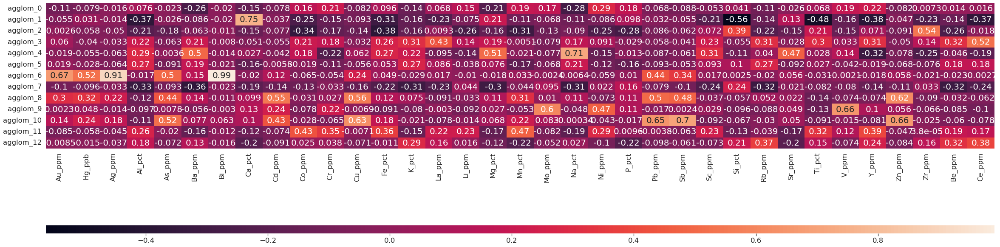

In [50]:
# Matriz de correlación de clusteres aglomerativos con las variables de interes
grid_kws = {"height_ratios": (.9, 0.05), "hspace":1}
sns.set(font_scale=1.5)
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws,figsize=(40, 10))

ax = sns.heatmap(corr_mat3.iloc[69:,:35], ax=ax,

                 cbar_ax=cbar_ax,

                 cbar_kws={"orientation": "horizontal"},annot = True, annot_kws = {'size':20})

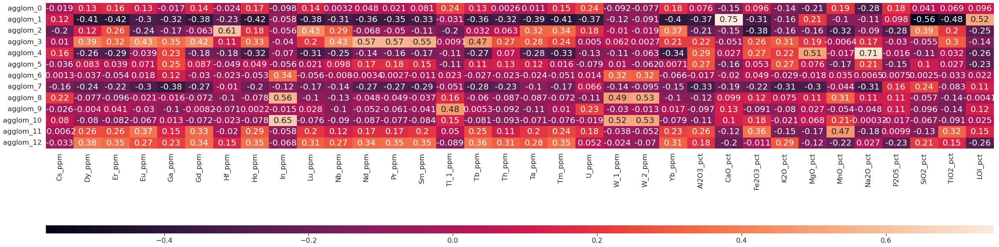

In [51]:
# Matriz de correlación de clusteres aglomerativos con las variables de interes
grid_kws = {"height_ratios": (.9, 0.05), "hspace":1}
sns.set(font_scale=1.5)
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws,figsize=(40, 10))

ax = sns.heatmap(corr_mat3.iloc[69:,35:69], ax=ax,

                 cbar_ax=cbar_ax,

                 cbar_kws={"orientation": "horizontal"},annot = True, annot_kws = {'size':20})

In [52]:
# se guarda la matriz de correlaciones de los cluster aglomerativo con las varaibles en excel
corr_mat3.to_excel('corr_mat13_g.xlsx', sheet_name='corr')

## DBSCAN

El tercer método es el agrupamiento espacial basado en densidad con ruido(DBSCAN). Este se encarga de clasificar las observaciones en tres tipos: 

Puntos core: son aquellos puntos que cumplen con las condiciones de densidad que hayamos fijado. 

Puntos alcanzables: son aquellos puntos que, aun no cumplen con las condiciones de densidad, pero tienen cerca otros puntos core. 

Ruido: son los puntos que no cumplen con las condiciones de densidad y, además, en su radio no tienen otros puntos. 

Para el DBSCAN se calcula la matriz de distancias entre los distintos puntos. Generalmente se utiliza la distancia Euclídea, aunque se pueden usar otras. Teniendo en cuenta los parámetros del modelo, clasifica a cada punto entre punto core, punto frontera y ruido. En este sentido, puede que salgan diferentes puntos core ya que puede haber varias zonas de densidad. Cada uno de esos puntos core pertenecerá a un clúster y se asigna los núcleos alcanzables de cada clúster al clúster. (Fernández Jauregui, s.f.) 

Para este algoritmo se usa el parámetro eps: en el cual dos puntos se consideran vecinos si la distancia entre los dos puntos está por debajo del umbral épsilon y min_samples: el número mínimo de vecinos que debe tener un punto dado para ser clasificado como un punto central.  

Como distancia se usa la distancia euclídea. 

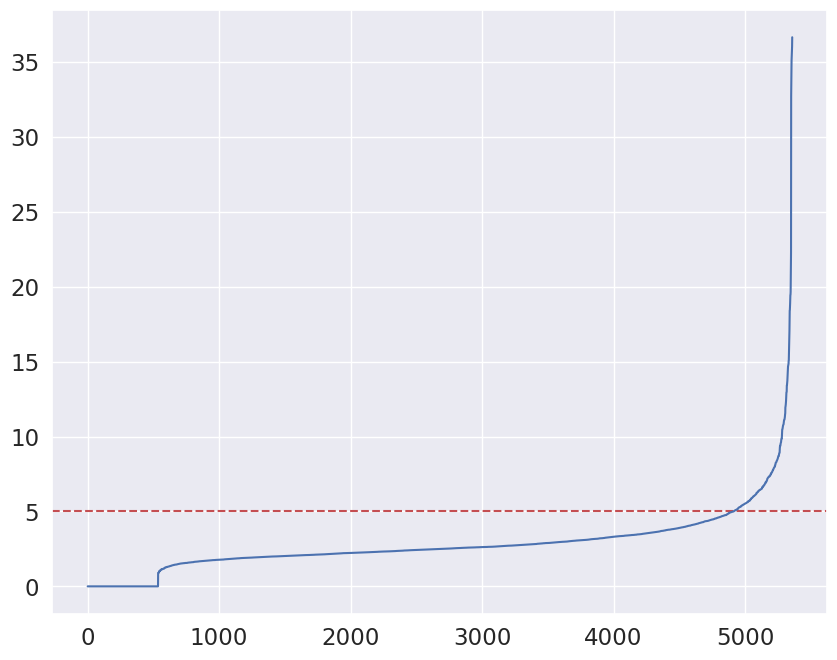

In [53]:
# Cargamos NeighborsNeighbors
from sklearn.neighbors import NearestNeighbors

neigh = NearestNeighbors(n_neighbors = 10)
nbrs = neigh.fit(scores_pca)
distancias, indices = nbrs.kneighbors(scores_pca)
distancias = np.sort(distancias.flatten())
fig=plt.figure(figsize=(10,8), dpi= 100, facecolor='w', edgecolor='k')
plt.axhline(y = 5, color = 'r', linestyle = '--')
plt.plot(distancias)

In [54]:
# Hallamos el valor optimo de epsilon en 4.48
from kneed import KneeLocator
i = np.arange(len(distancias))
knee = KneeLocator(i, distancias, S=1, curve='convex', direction='increasing', interp_method='polynomial')

print(distancias[knee.knee])

4.48604901670829


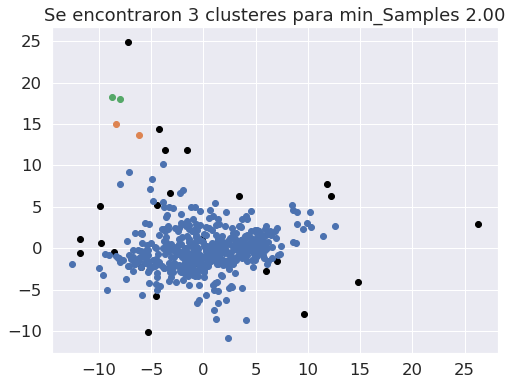

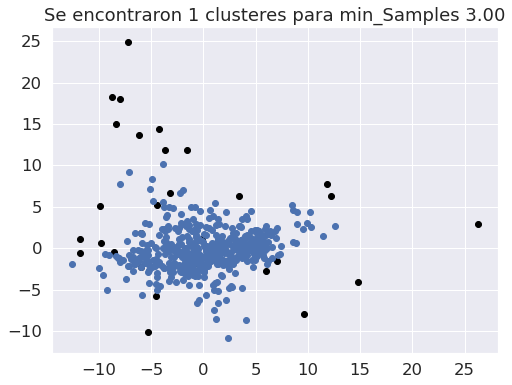

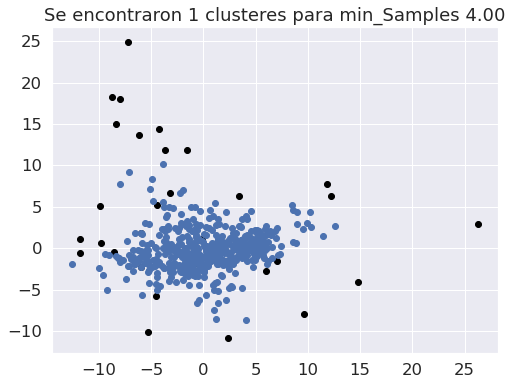

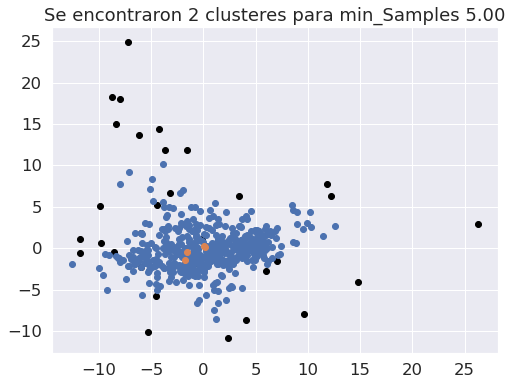

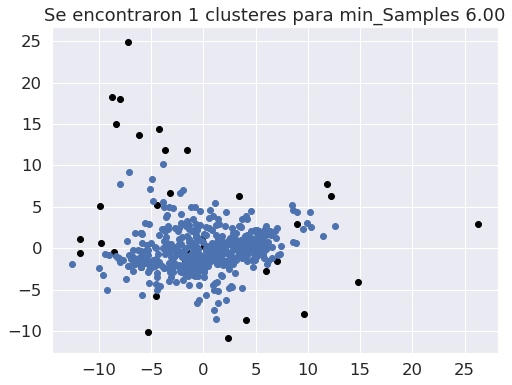

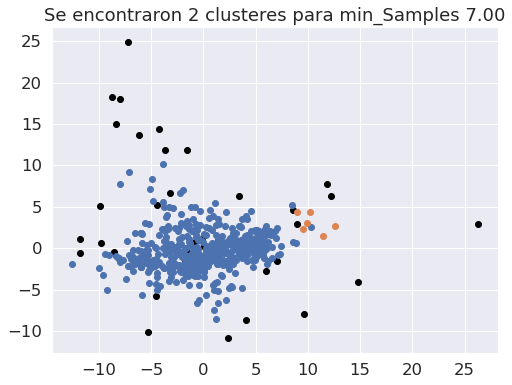

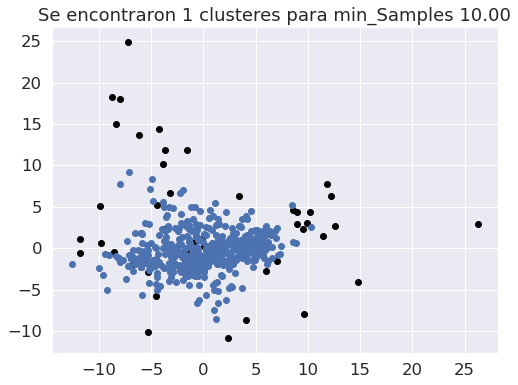

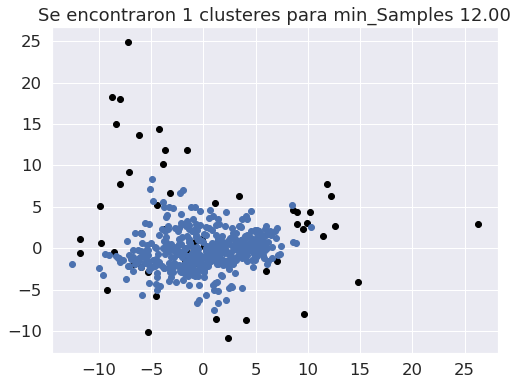

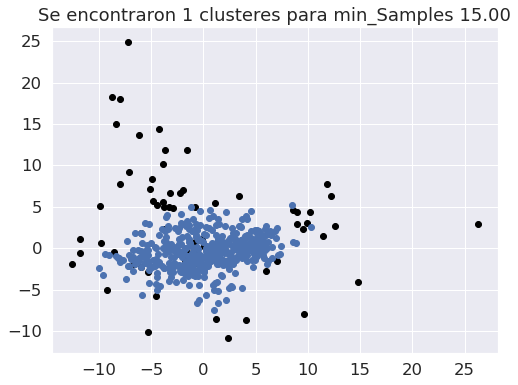

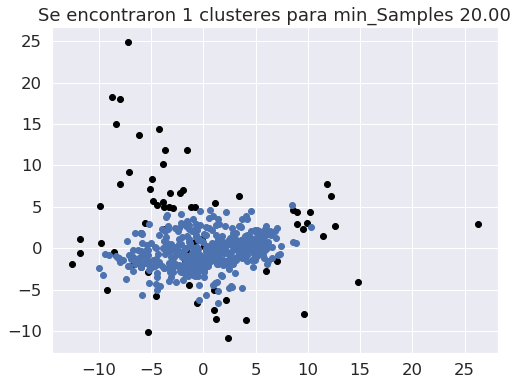

In [56]:
# se cargan y corren las librerias del algoritmo DBSCAN
from sklearn.cluster import DBSCAN
plt.rcParams["figure.figsize"] = (8,6)
for minpts in [2, 3, 4,5,6,7,10,12,15,20]:
    db = DBSCAN(eps = 4.48, min_samples = minpts).fit(scores_pca)
    clusteres = db.labels_
    n_clusteres = len(set(clusteres)) - (1 if -1 in clusteres else 0)
    resultado = pd.DataFrame(scores_pca).assign(Cluster = clusteres)
    plt.figure()
    for k in np.unique(clusteres):
        if k != -1:
            plt.scatter(
                x = resultado.loc[resultado.Cluster == k, 0], 
                y = resultado.loc[resultado.Cluster == k, 1]
                )
        else:
            plt.scatter(
                x = resultado.loc[resultado.Cluster == k, 0], 
                y = resultado.loc[resultado.Cluster == k, 1],
                c = "black"
                )
    plt.title('Se encontraron %d clusteres para min_Samples %0.2f' % (n_clusteres, minpts))


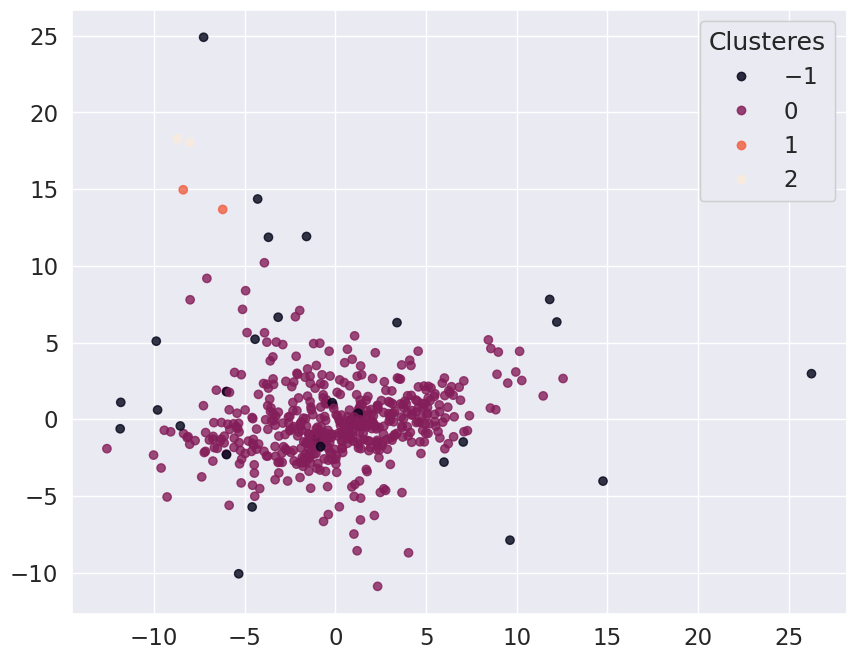

In [57]:
# Se toman 3 cluster con DBSCAN
db = DBSCAN(eps=4.48, min_samples=2)
clusters=db.fit_predict(scores_pca)

fig, ax = plt.subplots(figsize=(10,8), dpi= 100, facecolor='w', edgecolor='k')
g = plt.scatter(scores_pca[:,0], scores_pca[:,1], c = clusters, alpha = 0.8)
legend = ax.legend(*g.legend_elements(), loc = "upper right", title = "Clusteres")
ax.add_artist(legend)
plt.show()

Con DBSCAN se tiende a agrupar los datos en un solo cluster, por lo cual se descarta este metodo ya que se busca generar posibles zonas con agrupacion de elementos de interes que puedan indicar un yacimiento minero y este metodo no realiza una discriminacion de los datos mas detallada.

In [58]:
# Se crea una nueva variable para los cluster generados con DBSCAN
df_pca_agglom["clusters_dbs"]=clusters

In [59]:
df_pca_agglom.head(-20)

,Au_ppm,Hg_ppb,Ag_ppm,Al_pct,As_ppm,Ba_ppm,Bi_ppm,Ca_pct,Cd_ppm,Co_ppm,...,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,agglom,clusters_dbs
0,0.000000,85.9,0.779645,6.157344,22.14267,223.4628,0.0,0.413885,0.000000,17.201376,...,-1.512969,1.661558,2.364037,2.038334,-0.398224,-0.540505,-0.292552,-0.064857,0,0
1,0.000000,110.0,0.891250,5.507157,32.90210,218.9847,0.0,0.731051,1.094613,12.120732,...,-1.926498,2.142653,2.628671,-0.790130,1.271564,-2.448458,-0.201048,-2.472824,7,0
2,0.000000,195.0,0.802467,5.442956,28.99644,224.7234,0.0,2.612237,0.000000,16.689348,...,-1.945636,-0.151026,1.319563,2.606516,-0.686350,-0.466340,0.089669,-0.293969,7,0
3,0.000000,134.0,0.882220,7.204727,46.78234,179.9919,0.0,0.242813,0.000000,19.222920,...,-0.332223,1.183902,2.721545,3.399843,-0.962293,-0.320244,-0.397469,0.708341,0,0
4,0.000000,80.5,0.807313,7.362417,20.45032,195.3974,0.0,0.360613,0.000000,19.609992,...,0.768885,1.005685,3.827270,2.055592,-1.169075,0.483026,-1.378708,-0.706778,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,0.000000,77.9,0.000000,9.940000,0.00000,564.0000,0.0,0.510000,0.000000,9.000000,...,0.144544,-3.730496,-2.036797,0.930629,-0.807088,-1.653177,2.087637,1.714428,5,0
512,0.006032,158.0,0.000000,6.650000,0.00000,191.0000,0.0,0.040000,0.000000,3.000000,...,-6.556803,3.894659,-3.701252,2.417666,-0.320999,1.257364,2.112550,1.214930,2,0
513,0.005336,62.7,0.000000,7.710000,8.00000,516.0000,0.0,0.700000,0.000000,14.000000,...,0.404699,-1.932997,-1.091462,0.428830,-0.081136,0.064780,0.625331,-0.060312,5,0
514,0.000000,45.0,0.000000,7.300000,0.00000,335.0000,0.0,0.460000,0.000000,12.000000,...,-1.472919,0.087208,-0.856195,-1.080918,-0.284901,0.334372,0.825280,0.676771,12,0


In [60]:
# grafica con todos los cluster usando DBSCAN
dat = df_pca_agglom
fig = px.scatter_3d(dat, x='PCA_1', y='PCA_2', z='PCA_3',
              color='clusters_dbs')
fig.show()
fig.write_html("dbscan3")

In [61]:
b2["clusters_dbs"]=clusters

In [62]:
b2.head(-20)

,Muestra,Codigo_estandar,Longitud,Latitud,UTM_E,UTM_N,Zona,Region,Region_Hidrografica,Cuenca,...,K2O_pct,MgO_pct,MnO_pct,Na2O_pct,P2O5_pct,SiO2_pct,TiO2_pct,LOI_pct,agglom,clusters_dbs
0,MS001,JU25GL04,-75.615,-11.624,433000.000000,8.715000e+06,18,Junín,Amazonas,Cuenca Mantaro,...,1.209799,0.547251,0.190361,0.169776,0.258084,63.402262,0.852058,15.069860,0,0
1,MS002,JU25GL04,-75.596,-11.624,435000.000000,8.715000e+06,18,Junín,Amazonas,Cuenca Mantaro,...,1.560920,0.583359,0.133624,0.123136,0.576529,66.472176,0.602782,12.749004,7,0
2,MS003,JU25GL04,-75.578,-11.624,437000.000000,8.715000e+06,18,Junín,Amazonas,Cuenca Mantaro,...,1.398224,1.219700,0.116755,0.333822,0.331651,63.128540,0.879743,13.262343,7,0
3,MS004,JU25GL04,-75.651,-11.642,429000.000000,8.713000e+06,18,Junín,Amazonas,Cuenca Mantaro,...,1.293910,0.697150,0.171097,0.112865,0.158371,61.246408,1.012535,13.134328,0,0
4,MS005,JU25GL04,-75.633,-11.642,431000.000000,8.713000e+06,18,Junín,Amazonas,Cuenca Mantaro,...,1.561313,0.845544,0.249645,0.174458,0.276759,56.111317,1.012983,18.577075,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,S04W53BS01T,LO31GL01,-75.212,-4.770,476479.715073,9.472789e+06,18,Loreto,Amazonas,Intercuenca Media Bajo Marañón,...,2.260000,1.590000,0.030000,0.960000,0.150000,57.950000,0.840000,12.630000,5,0
512,S04W53CS01T,LO31GL01,-75.859,-5.512,404839.196762,9.390704e+06,18,Loreto,Amazonas,Intercuenca Bajo Huallaga,...,0.890000,0.450000,0.000000,0.000000,0.070000,72.780000,1.200000,10.370000,2,0
513,S04W53DS01T,LO31GL01,-75.020,-5.542,497795.908970,9.387456e+06,18,Loreto,Amazonas,Intercuenca 49913,...,2.140000,1.390000,0.060000,1.140000,0.270000,59.950000,0.890000,11.770000,5,0
514,S04W54AS01T,LO31GL01,-77.184,-4.734,257752.023520,9.476302e+06,18,Loreto,Amazonas,Intercuenca 49877,...,1.850000,1.090000,0.060000,0.630000,0.160000,62.890000,0.800000,11.890000,12,0


In [ ]:
# Se guarda el excel con el total de cluster aglomerativo y DBSCAN

In [63]:
b2.to_excel("base_clusters13_n.xlsx", sheet_name='corr')

In [64]:
# Se crean variables dummi para los cluster DBSCAN
b2_dum2=pd.get_dummies(b2,columns=["clusters_dbs"])
b2_dum2.head()

,Muestra,Codigo_estandar,Longitud,Latitud,UTM_E,UTM_N,Zona,Region,Region_Hidrografica,Cuenca,...,Na2O_pct,P2O5_pct,SiO2_pct,TiO2_pct,LOI_pct,agglom,clusters_dbs_-1,clusters_dbs_0,clusters_dbs_1,clusters_dbs_2
0,MS001,JU25GL04,-75.615,-11.624,433000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0.169776,0.258084,63.402262,0.852058,15.069860,0,0,1,0,0
1,MS002,JU25GL04,-75.596,-11.624,435000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0.123136,0.576529,66.472176,0.602782,12.749004,7,0,1,0,0
2,MS003,JU25GL04,-75.578,-11.624,437000.0,8715000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0.333822,0.331651,63.128540,0.879743,13.262343,7,0,1,0,0
3,MS004,JU25GL04,-75.651,-11.642,429000.0,8713000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0.112865,0.158371,61.246408,1.012535,13.134328,0,0,1,0,0
4,MS005,JU25GL04,-75.633,-11.642,431000.0,8713000.0,18,Junín,Amazonas,Cuenca Mantaro,...,0.174458,0.276759,56.111317,1.012983,18.577075,0,0,1,0,0


In [65]:
m22=['Au_ppm', 'Hg_ppb',
       'Ag_ppm', 'Al_pct', 'As_ppm', 'Ba_ppm', 'Bi_ppm', 'Ca_pct', 'Cd_ppm',
       'Co_ppm', 'Cr_ppm', 'Cu_ppm', 'Fe_pct', 'K_pct', 'La_ppm', 'Li_ppm',
       'Mg_pct', 'Mn_pct', 'Mo_ppm', 'Na_pct', 'Ni_ppm', 'P_pct', 'Pb_ppm',
       'Sb_ppm', 'Sc_ppm', 'Si_pct', 'Rb_ppm', 'Sr_ppm', 'Ti_pct', 'V_ppm',
       'Y_ppm', 'Zn_ppm', 'Zr_ppm', 'Be_ppm', 'Ce_ppm', 'Cs_ppm', 'Dy_ppm',
       'Er_ppm', 'Eu_ppm', 'Ga_ppm', 'Gd_ppm', 'Hf_ppm', 'Ho_ppm', 'In_ppm',
       'Lu_ppm', 'Nb_ppm', 'Nd_ppm', 'Pr_ppm', 'Sm_ppm', 'Tl_1_ppm', 'Tb_ppm',
       'Th_ppm', 'Ta_ppm', 'Tm_ppm', 'U_ppm', 'W_1_ppm', 'W_2_ppm', 'Yb_ppm',
       'Al2O3_pct', 'CaO_pct', 'Fe2O3_pct', 'K2O_pct', 'MgO_pct', 'MnO_pct',
       'Na2O_pct', 'P2O5_pct', 'SiO2_pct', 'TiO2_pct', 'LOI_pct', "clusters_dbs_-1","clusters_dbs_0","clusters_dbs_1","clusters_dbs_2"]

In [66]:
# matriz de correlación para los cluster DBSCAN
corr_mat33 =b2_dum2[m22].corr()

for x in range(len(m22)):
    corr_mat3.iloc[x,x] = 0.0
    
corr_mat33.iloc[69:,:69]

,Au_ppm,Hg_ppb,Ag_ppm,Al_pct,As_ppm,Ba_ppm,Bi_ppm,Ca_pct,Cd_ppm,Co_ppm,...,CaO_pct,Fe2O3_pct,K2O_pct,MgO_pct,MnO_pct,Na2O_pct,P2O5_pct,SiO2_pct,TiO2_pct,LOI_pct
clusters_dbs_-1,0.300198,0.079389,0.216300,-0.029198,0.162038,0.079786,0.181200,0.119231,0.240872,-0.013792,...,0.119113,0.017272,0.060919,0.234914,0.026898,0.090631,0.180912,-0.117958,0.034082,0.036603
clusters_dbs_0,-0.333555,-0.160487,-0.266929,0.067173,-0.341191,-0.103008,-0.192965,-0.149866,-0.383386,0.023054,...,-0.149758,-0.080694,-0.049703,-0.245298,-0.103170,-0.084996,-0.163641,0.135176,0.001075,-0.043517
clusters_dbs_1,0.080200,0.273639,0.113536,-0.066134,0.300972,0.033747,-0.002976,0.079788,0.335245,-0.016738,...,0.079793,0.082960,-0.009191,0.057917,0.161362,-0.004638,-0.018361,-0.057929,-0.068650,0.034075
clusters_dbs_2,0.120450,0.060289,0.134384,-0.088348,0.433554,0.075370,0.091564,0.067471,0.275550,-0.022515,...,0.067475,0.167585,-0.019984,0.038011,0.141396,0.004183,-0.005952,-0.036885,-0.059906,0.001452


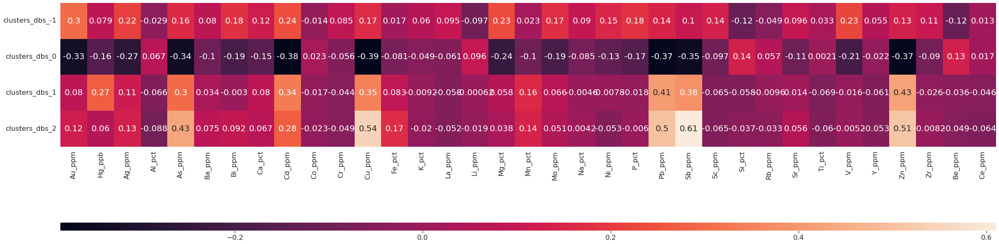

In [67]:
# Matriz de correlación entre los cluster DBSCAN  y las variables
grid_kws = {"height_ratios": (.9, 0.05), "hspace":1}
sns.set(font_scale=1.5)
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws,figsize=(40, 10))

ax = sns.heatmap(corr_mat33.iloc[69:,:35], ax=ax,

                 cbar_ax=cbar_ax,

                 cbar_kws={"orientation": "horizontal"},annot = True, annot_kws = {'size':20})

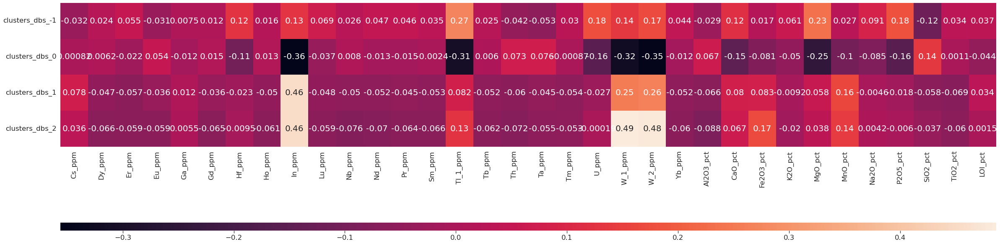

In [68]:
# Matriz de correlación entre los cluster DBSCAN  y las variables
grid_kws = {"height_ratios": (.9, 0.05), "hspace":1}
sns.set(font_scale=1.5)
f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws,figsize=(40, 10))

ax = sns.heatmap(corr_mat33.iloc[69:,35:69], ax=ax,

                 cbar_ax=cbar_ax,

                 cbar_kws={"orientation": "horizontal"},annot = True, annot_kws = {'size':20})

In [69]:
# Se guarda la correlación entre los cluster DBSCAN y las variables
corr_mat33.to_excel('corr_mat3_dbs.xlsx', sheet_name='corr')

## Target de exploración

Mapa con las dos zonas que se proponen para realizar analisis adicionales, una en rojo entre el sector de Cochamarca y la reserva de Junín y la otro en la franja al sur este del mapa entre la zona de Huancayo y Jauja, siguiendo la rivera del rio Mantaro (puntos amarillos y magenta).

Estas zonas pueden ser de interes para la busqueda de yacimientos de sulfuros masivos e hidrotermales.

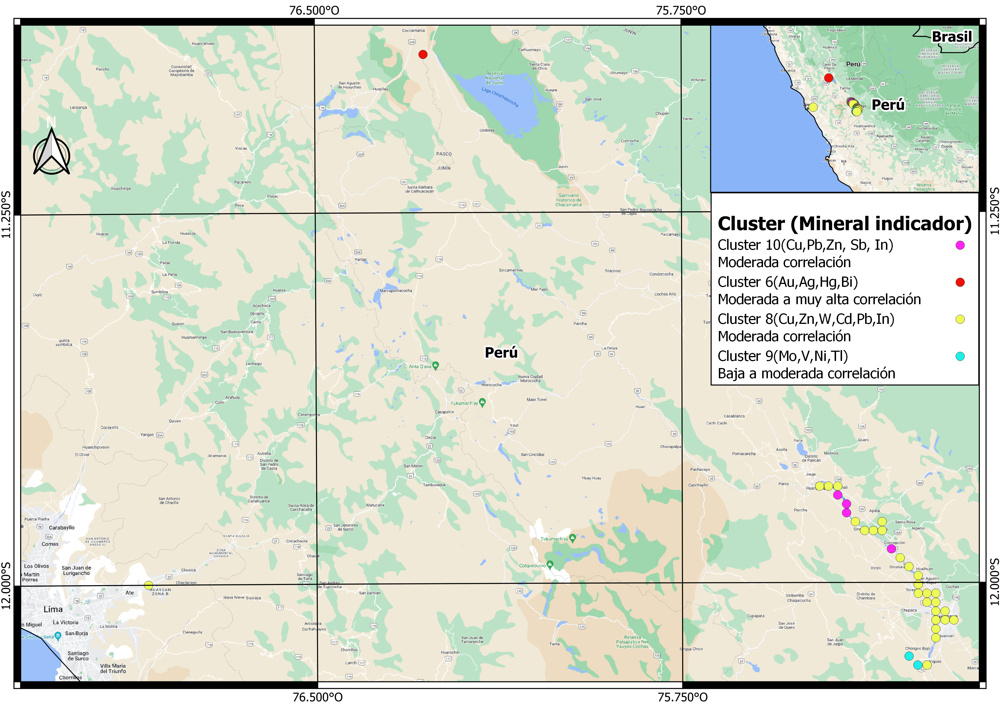